# Two-Stage Puma Inference (Detector + Classifier)
Loads your **trained classifier** (`.h5`) and **YOLO detector** (`.pt`) and evaluates a test set.
Outputs per-image visualizations, a detection-level CSV, and an image-level summary CSV.


In [1]:
# === Runtime Setup (CPU-safe by default) ===
USE_CPU_ONLY = True  # set to False to try GPU with memory growth

import os
if USE_CPU_ONLY:
    os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # force CPU to avoid cuDNN issues

import tensorflow as tf

if not USE_CPU_ONLY:
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            print("Enabled GPU memory growth.")
        except Exception as e:
            print("Could not set GPU memory growth:", e)

print("TF:", tf.__version__)
print("Devices:", tf.config.list_physical_devices())

2025-09-19 00:29:59.580282: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758241799.861919      13 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758241799.945477      13 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


TF: 2.18.0
Devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


2025-09-19 00:30:20.341736: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [2]:
# === Installs (run once, then Restart Kernel) ===
%pip install -U ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 46.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [3]:
# === Config (EDIT THESE PATHS) ===
from pathlib import Path

# Paths to models
MODEL_H5       = Path("/kaggle/input/two-stage-puma-weights/puma_cls_efficientnetv2s.h5")   # <-- EDIT if different
YOLO_WEIGHTS   = Path("/kaggle/input/two-stage-puma-weights/yolov8s.pt")                                               # or your fine-tuned .pt
BESTT_NPZ      = Path("puma_two_stage_work/eval/val_probs_labels.npz")            # optional; for threshold



# Output directory
EVAL_DIR       = Path("./puma_two_stage_infer_eval")
TEST_OUT_DIR   = EVAL_DIR / "test_viz"
for p in [EVAL_DIR, TEST_OUT_DIR]:
    p.mkdir(parents=True, exist_ok=True)

# Inference params
IMAGE_SIZE     = 384        # must match training
CONF_THRESH    = 0.25       # YOLO confidence threshold
IOU_THRESH     = 0.45       # YOLO NMS IoU
MAX_DETS       = 12         # max detections per image
CROP_EXPAND    = 0.15       # padding around detected box for crop

print("Configured paths:")
print("MODEL_H5:", MODEL_H5)
print("YOLO_WEIGHTS:", YOLO_WEIGHTS)
print("BESTT_NPZ:", BESTT_NPZ)


Configured paths:
MODEL_H5: /kaggle/input/two-stage-puma-weights/puma_cls_efficientnetv2s.h5
YOLO_WEIGHTS: /kaggle/input/two-stage-puma-weights/yolov8s.pt
BESTT_NPZ: puma_two_stage_work/eval/val_probs_labels.npz


In [4]:
# === Imports ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

from ultralytics import YOLO
from tensorflow import keras
from tensorflow.keras.applications import efficientnet_v2

print("Imports ready.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Imports ready.


In [5]:
# === Load models and decision threshold ===
assert MODEL_H5.exists(), f"Classifier .h5 not found: {MODEL_H5}"
clf = keras.models.load_model(MODEL_H5)
# Optional: compile to attach metrics (not required for predict)
try:
    clf.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy", tf.keras.metrics.AUC(name="auc")])
except Exception as e:
    print("Compile skipped:", e)

# YOLO detector (ultralytics will download yolov8s.pt if necessary)
detector = YOLO(str(YOLO_WEIGHTS))

# Load best threshold if available; else default to 0.5
if BESTT_NPZ.exists():
    npz = np.load(BESTT_NPZ, allow_pickle=True)
    best_t = float(npz["best_t"])
    print("Loaded best_t from NPZ:", best_t)
else:
    best_t = 0.5
    print("BESTT_NPZ not found; using default threshold:", best_t)

BESTT_NPZ not found; using default threshold: 0.5


In [6]:
# Test data path: folder OR single image file
TEST_PATH      = Path("/kaggle/input/testlion02/testlion02")                            # <-- EDIT this
print("TEST_PATH:", TEST_PATH)

TEST_PATH: /kaggle/input/testlion02/testlion02


In [7]:
# === Collect test images (folder OR single file) ===
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".gif"}

if not TEST_PATH.exists():
    # Helpful listing for Kaggle
    base = Path("/kaggle/input")
    if base.exists():
        print(f"[!] TEST_PATH not found: {TEST_PATH}")
        print("Entries under /kaggle/input:")
        for p in list(base.iterdir())[:30]: print("  -", p)
    raise FileNotFoundError(f"Update TEST_PATH to a real folder or file.")

if TEST_PATH.is_file():
    if TEST_PATH.suffix.lower() in IMG_EXTS:
        img_paths = [TEST_PATH]
    else:
        raise ValueError(f"TEST_PATH is a file but not an image: {TEST_PATH}")
else:
    img_paths = sorted([p for p in TEST_PATH.rglob("*") if p.suffix.lower() in IMG_EXTS])

if not img_paths:
    raise RuntimeError(f"No images found under {TEST_PATH}.")

print(f"Found {len(img_paths)} images for inference under {TEST_PATH}.")

Found 62 images for inference under /kaggle/input/testlion02/testlion02.


In [8]:
# === Two-stage inference helpers ===
def expand_box(xyxy, expand, W, H):
    x1, y1, x2, y2 = xyxy
    w, h = x2 - x1, y2 - y1
    dx, dy = w * CROP_EXPAND, h * CROP_EXPAND
    return [max(0, int(x1 - dx)), max(0, int(y1 - dy)), min(W - 1, int(x2 + dx)), min(H - 1, int(y2 + dy))]

def prob_puma_from_crop(pil_img):
    arr = keras.utils.img_to_array(pil_img.resize((IMAGE_SIZE, IMAGE_SIZE)))
    arr = np.expand_dims(arr, 0)
    arr = efficientnet_v2.preprocess_input(arr)
    p = float(clf.predict(arr, verbose=0).ravel()[0])
    return p

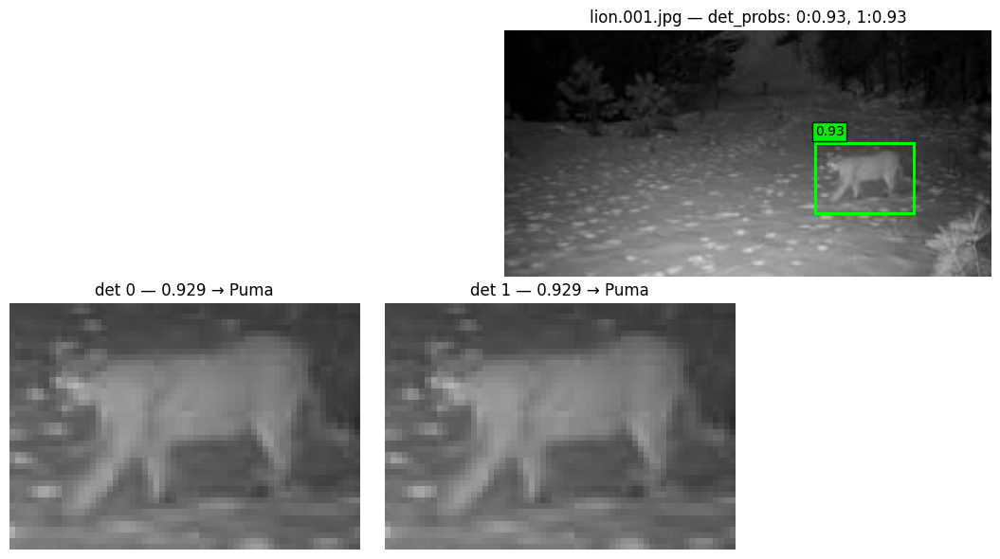

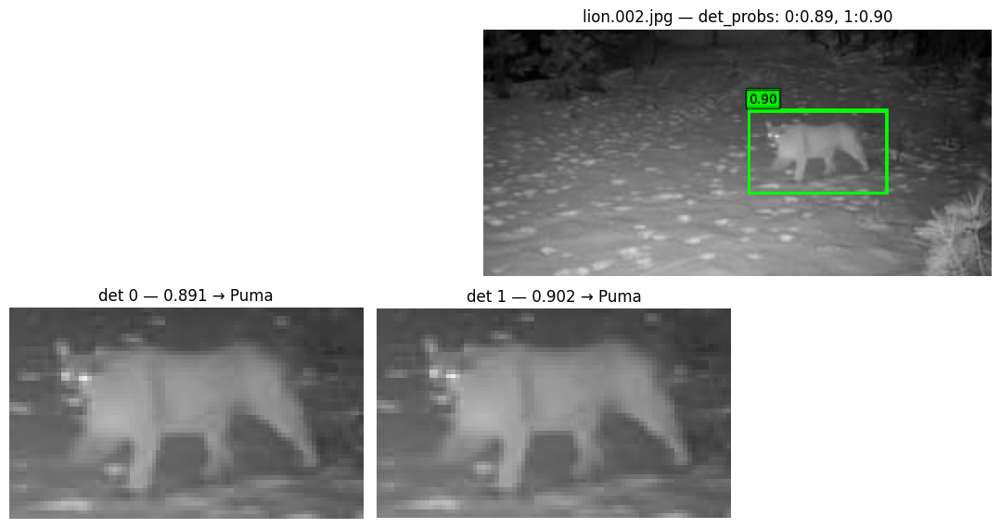

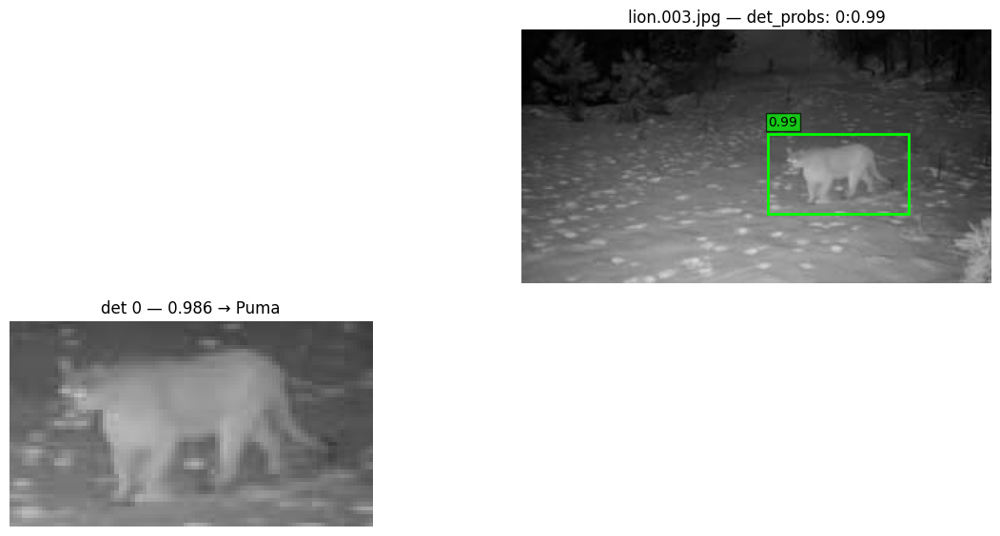

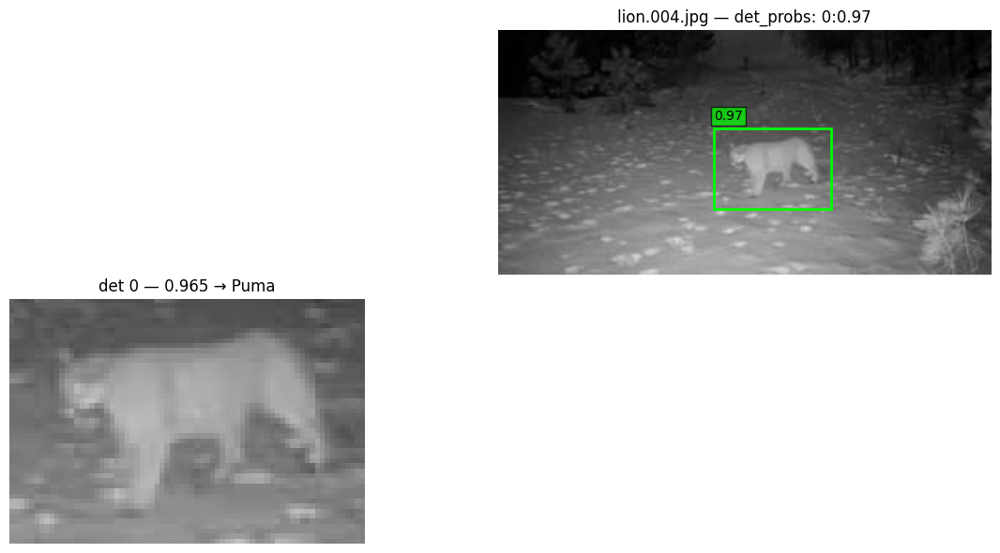

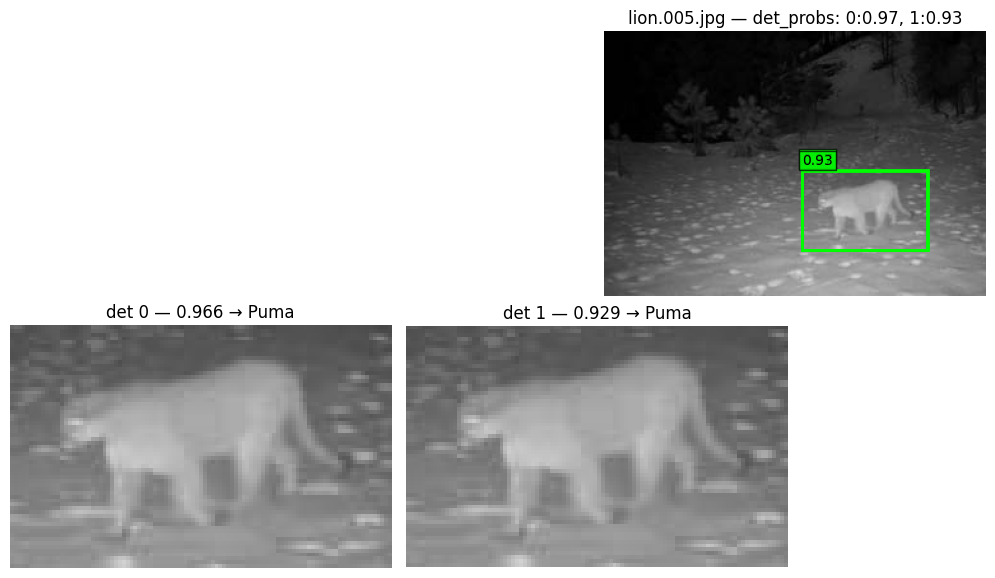

...

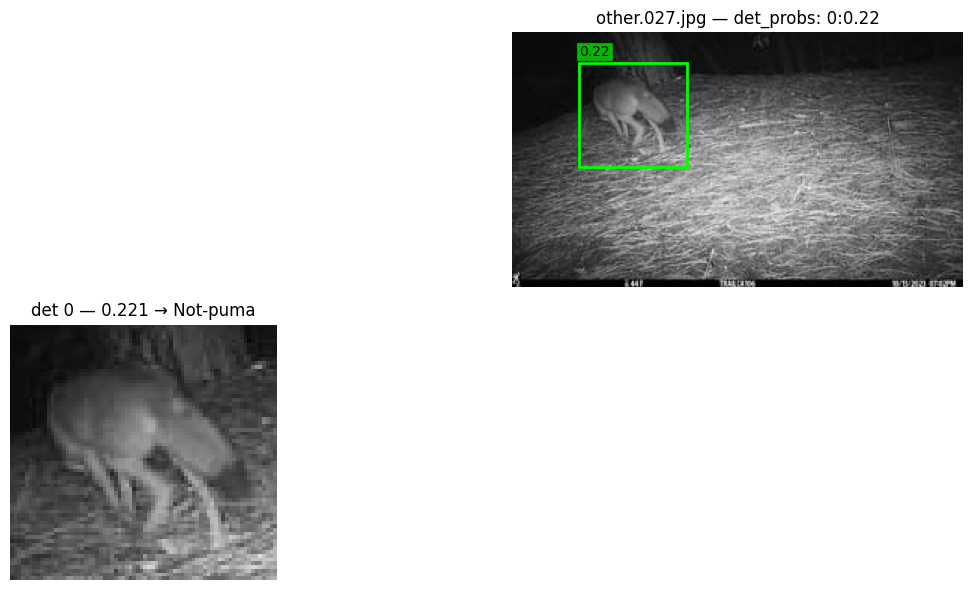

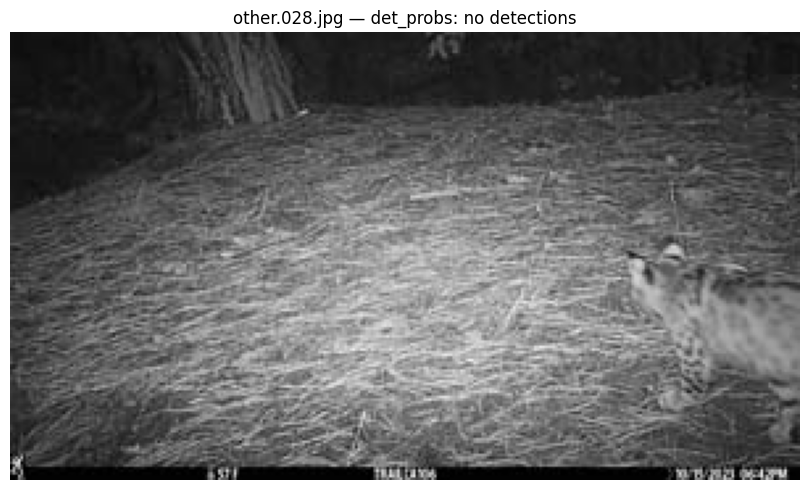

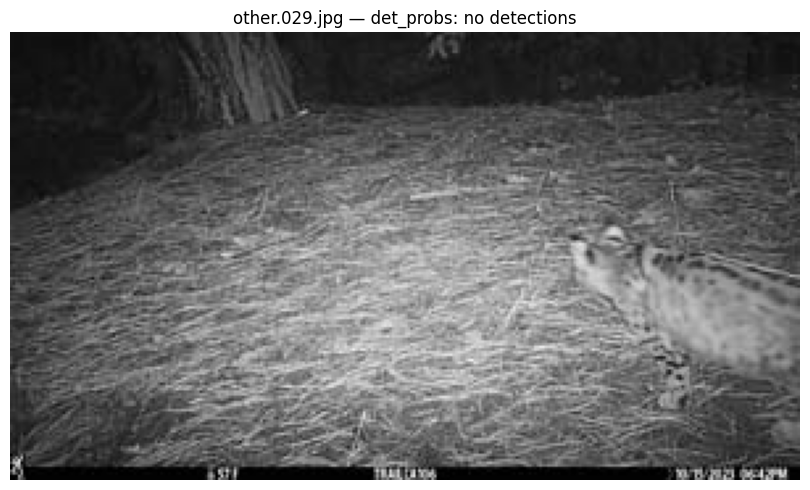

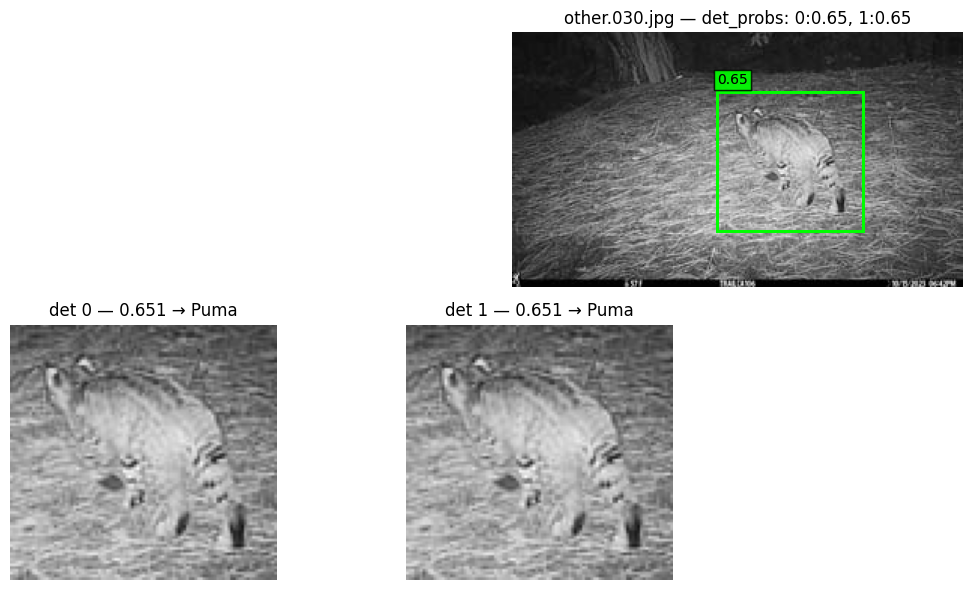

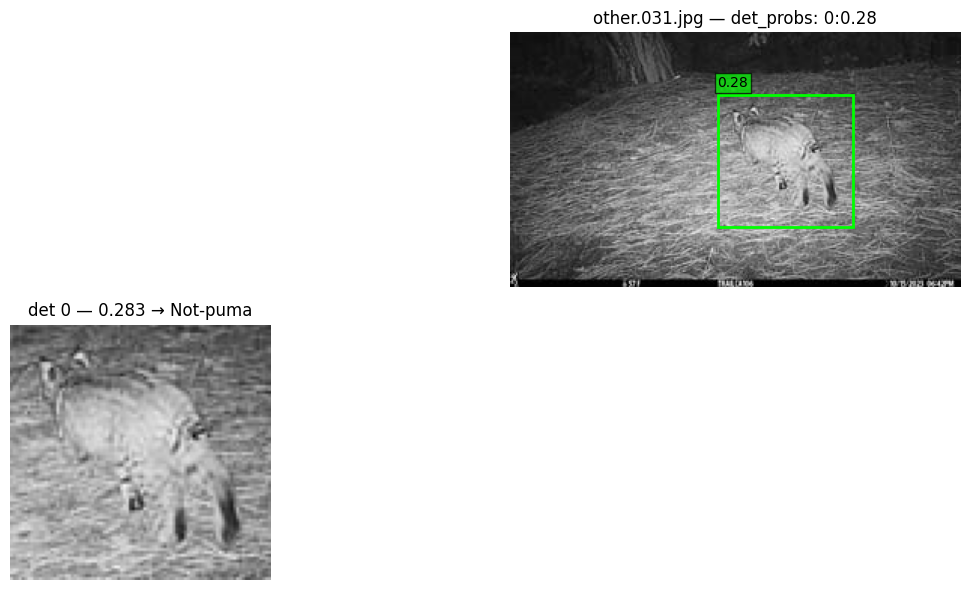

Saved detection-level predictions → puma_two_stage_infer_eval/test_detections_predictions.csv
Saved image-level summary       → puma_two_stage_infer_eval/test_image_summary.csv
Saved visualizations            → puma_two_stage_infer_eval/test_viz


In [9]:
# === Run inference with visualizations and CSV outputs ===
all_rows = []
image_summary = []

for fp in img_paths:
    im = Image.open(fp).convert("RGB")
    W, H = im.size

    # Detect animals
    res = detector.predict(str(fp), imgsz=640, conf=CONF_THRESH, iou=IOU_THRESH, max_det=MAX_DETS, verbose=False)
    boxes = (res[0].boxes.xyxy.cpu().numpy()
             if res and res[0].boxes is not None and res[0].boxes.xyxy is not None
             else [])

    det_probs, crops_xyxy, crops_imgs = [], [], []
    for j, (x1, y1, x2, y2) in enumerate(boxes):
        x1e, y1e, x2e, y2e = expand_box([x1, y1, x2, y2], CROP_EXPAND, W, H)
        crop = im.crop((x1e, y1e, x2e, y2e))
        p = prob_puma_from_crop(crop)
        det_probs.append(p)
        crops_xyxy.append((x1e, y1e, x2e, y2e))
        crops_imgs.append(crop)
        all_rows.append({
            "file": fp.name,
            "det_id": j,
            "x1": x1e, "y1": y1e, "x2": x2e, "y2": y2e,
            "prob_puma": p,
            "pred_label": "Puma" if p >= best_t else "Not-puma"
        })

    # Visualization: original image with boxes + crops grid
    rows = 1 + ((len(crops_imgs) + 3) // 4)  # 1 row for original, rest for crops
    fig = plt.figure(figsize=(max(8, min(16, 4 * 4)), max(5, 3 * rows)))

    # Original with boxes
    ax = fig.add_subplot(rows, 1, 1)
    ax.imshow(im); ax.axis("off")
    for p, (x1e, y1e, x2e, y2e) in zip(det_probs, crops_xyxy):
        rect = plt.Rectangle((x1e, y1e), x2e - x1e, y2e - y1e, fill=False, color='lime', linewidth=2)
        ax.add_patch(rect)
        ax.text(x1e, max(0, y1e - 5), f"{p:.2f}", color='black',
                bbox=dict(facecolor='lime', alpha=0.7, pad=2))
    title_probs = (", ".join(f"{i}:{p:.2f}" for i, p in enumerate(det_probs)) if det_probs else "no detections")
    ax.set_title(f"{fp.name} — det_probs: {title_probs}")

    # Crops grid
    idx = 0
    for r in range(1, rows):
        for c in range(1, 5):
            if idx >= len(crops_imgs): break
            axc = fig.add_subplot(rows, 4, r * 4 + c)
            axc.imshow(crops_imgs[idx]); axc.axis("off")
            lbl = "Puma" if det_probs[idx] >= best_t else "Not-puma"
            axc.set_title(f"det {idx} — {det_probs[idx]:.3f} → {lbl}")
            idx += 1

    out_png = TEST_OUT_DIR / f"{fp.stem}_viz.png"
    plt.tight_layout(); plt.savefig(out_png, dpi=160); plt.show()

    # Image-level summary
    if det_probs:
        image_summary.append({
            "file": fp.name,
            "num_dets": len(det_probs),
            "mean_prob": float(np.mean(det_probs)),
            "max_prob": float(np.max(det_probs)),
            "agg_label_mean": "Puma" if np.mean(det_probs) >= best_t else "Not-puma",
            "agg_label_max":  "Puma" if np.max(det_probs)  >= best_t else "Not-puma",
            "viz_path": str(out_png)
        })
    else:
        image_summary.append({
            "file": fp.name,
            "num_dets": 0,
            "mean_prob": 0.0,
            "max_prob": 0.0,
            "agg_label_mean": "Not-puma",
            "agg_label_max":  "Not-puma",
            "viz_path": str(out_png)
        })

# Write CSV outputs
det_csv = EVAL_DIR / "test_detections_predictions.csv"
img_csv = EVAL_DIR / "test_image_summary.csv"
pd.DataFrame(all_rows).to_csv(det_csv, index=False)
pd.DataFrame(image_summary).to_csv(img_csv, index=False)

print("Saved detection-level predictions →", det_csv)
print("Saved image-level summary       →", img_csv)
print("Saved visualizations            →", TEST_OUT_DIR)

In [10]:
import pandas as pd
from pathlib import Path

# Path to the summary CSV produced by Cell D
summary_csv = Path(EVAL_DIR) / "test_image_summary.csv"
df = pd.read_csv(summary_csv)

# --- Determine ground-truth from filename ---
# Assumes: files with "lion" in the name are pumas; all others are not.
def true_label(fname: str) -> str:
    name = fname.lower()
    return "Puma" if "lion" in name else "Not-puma"

df["true_label"] = df["file"].apply(true_label)

# --- Use the predicted label from YOLO+EfficientNet ---
# We use the max-prob aggregation per image
df["pred_label"] = df["agg_label_max"]

# --- Compute accuracy ---
correct = (df["true_label"] == df["pred_label"]).sum()
total   = len(df)
percent_correct = 100.0 * correct / total

print(f"Images correct: {correct}/{total} ({percent_correct:.2f}%)")

# Optional: view a confusion matrix
cm = pd.crosstab(df["true_label"], df["pred_label"], margins=True)
print("\nConfusion matrix:\n", cm)


Images correct: 54/62 (87.10%)

Confusion matrix:
 pred_label  Not-puma  Puma  All
true_label                     
Not-puma          26     5   31
Puma               3    28   31
All               29    33   62
